In [4]:
!pip install -q diffusers transformers xformers accelerate
!pip install -q numpy scipy ftfy Pillow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.2/117.2 MB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.5 MB/s eta 0:00:00


In [5]:
import torch
import numpy as np
import os

import time

from PIL import Image
from IPython import display as IPdisplay
from tqdm.auto import tqdm

from diffusers import StableDiffusionPipeline
from diffusers import (
    DDIMScheduler,
    PNDMScheduler,
    LMSDiscreteScheduler,
    DPMSolverMultistepScheduler,
    EulerAncestralDiscreteScheduler,
    EulerDiscreteScheduler,
)
from transformers import logging

logging.set_verbosity_error()

In [6]:
print(torch.cuda.is_available())

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

True


In [7]:
torch.backends.cudnn.benchmark = True
torch.backends.cuda.matmul.allow_tf32 = True

In [8]:
model_name = "runwayml/stable-diffusion-v1-5"


In [9]:
scheduler = LMSDiscreteScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", num_train_timesteps=1000)

In [10]:
pipe = StableDiffusionPipeline.from_pretrained(model_name, scheduler=scheduler, torch_dtype=torch.float32)
pipe = pipe.to(device)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 14 files:   0%|          | 0/14 [00:00<?, ?it/s]

config.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

safety_checker/model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion.py:223: FutureWarning: The configuration file of this scheduler: LMSDiscreteScheduler {
  "_class_name": "LMSDiscreteScheduler",
  "_diffusers_version": "0.35.2",
  "beta_end": 0.012,
  "beta_schedule": "scaled_linear",
  "beta_start": 0.00085,
  "num_train_timesteps": 1000,
  "prediction_type": "epsilon",
  "steps_offset": 0,
  "timestep_spacing": "linspace",
  "trained_betas": null,
  "use_beta_sigmas": false,
  "use_exponential_sigmas": false,
  "use_karras_sigmas": false
}
 is outdated. `steps_offset` should be set to 1 instead of 0. Please make sure to update the config accordingly as leaving `steps_offset` might led to incorrect results in future versions. If you have downloaded this checkpoint from the Hugging Face Hub, it would be very nice if you could open a Pull request for the `scheduler/scheduler_config.json` file
  deprecate("steps_offset!=1", "1.0.0", deprecation_messag

In [11]:
pipe.set_progress_bar_config(disable=True)

In [12]:
# Optimizations for lower GPU memory consumption
# Offloading the weights to the CPU and only loading them on the GPU can reduce memory consumption to less than 3GB.
pipe.enable_model_cpu_offload()

# Tighter ordering of memory tensors.
pipe.unet.to(memory_format=torch.channels_last)

# Decoding large batches of images with limited VRAM or batches with 32 images or more by decoding the batches of latents one image at a time.
pipe.enable_vae_slicing()

# Splitting the image into overlapping tiles, decoding the tiles, and then blending the outputs together to compose the final image.
pipe.enable_vae_tiling()

In [13]:
# a function to display the image interpolation as a GIF and display in a notebook
def display_images(images, path):
  try:
    # convert each image in images array to a PIL Image
    images = [Image.fromarray(np.array(image[0], dtype=np.uint8)) for image in images]
    filename = (
            time.strftime("%H:%M:%S", time.localtime())
            .replace(":", "-")
        )
    images[0].save(
            f"{path}/{filename}.gif",
            save_all=True,
            append_images=images[1:],
            duration=100,
            loop=0,
        )
  except Exception as e:
    # If there is an error during the process, print the exception message.
    print(e)

  return IPdisplay.Image(f"{path}/{filename}.gif")



In [14]:

# The guidance scale is set to its normal range (7 - 10).
guidance_scale = 7.5 # usually gives better results, can be tuned.

# The number of inference steps was chosen empirically to generate an acceptable picture within an acceptable time.
num_inference_steps = 30

# The higher you set this value, the smoother the interpolations will be. However, the generation time will increase. This value was chosen empirically.
num_interpolation_steps = 30

# I would not recommend less than 512 on either dimension. This is because this model was trained on 512x512 image resolution.
height = 512
width = 512

# The path where the generated GIFs will be saved
save_path = "/output"

if not os.path.exists(save_path):
    os.makedirs(save_path)

The first method is prompt interpolation. Positive and Negative prompts provide conceptual points in latent space, leading to a variety of images between the points giving a smoothed transition. \
the interpolation is achieved by adding scaled deltas to both the positive and negative prompts embeddings. \
First of all, we need to tokenize and obtain embeddings for both positive and negative text prompts. The positive prompt guides the image generation towards the desired characteristics, while the negative prompt steers it away from unwanted features.

In [12]:
# these are the characteristice which we need to add gradually as the transition takes place
prompt = "Epic shot of a Royal Bengal Tiger, dense Indian jungle background, calm, serene, wonderful light setting, little photorealistic, digital painting, sharp focus, top wildlife photography image"
# these are the characteristics which we need to remove gradually as the transition takes place
neg_prompt = "poorly drawn,cartoon, 2d, disfigured, bad art, deformed, poorly drawn, extra limbs, close up, b&w, weird colors, blurry"

In [13]:
step_size = 0.002 # step size for interpolation

In [14]:
prompt_tokens = pipe.tokenizer(
    prompt,
    padding = "max_length",
    max_length = pipe.tokenizer.model_max_length,
    truncation=True,
    return_tensors = "pt"
)
prompt_embeds = pipe.text_encoder(prompt_tokens.input_ids.to(device))[0]

In [15]:
prompt_embeds.shape

torch.Size([1, 77, 768])

In [16]:
if neg_prompt is not None:
  negative_prompt_tokens = pipe.tokenizer(
      neg_prompt,
      padding="max_length",
      max_length=pipe.tokenizer.model_max_length,
      truncation=True,
      return_tensors="pt"
  )

In [17]:
neg_prompt_embeds = pipe.text_encoder(negative_prompt_tokens.input_ids.to(device))[0]

In [18]:
latents = torch.randn(
    1, pipe.unet.config.in_channels, height // 8, width // 8,
    generator=torch.manual_seed(42),
)

In [19]:
walked_embeddings = []
for i in range(num_interpolation_steps):
  walked_embeddings.append(
      [prompt_embeds + step_size * i, neg_prompt_embeds + step_size * i]
  )

In [24]:
# Generating images using the interpolated embeddings.
images = []
for latent in tqdm(walked_embeddings):
    images.append(
        pipe(
            height=height,
            width=width,
            num_images_per_prompt=1,
            prompt_embeds=latent[0],
            negative_prompt_embeds=latent[1],
            num_inference_steps=num_inference_steps,
            guidance_scale=guidance_scale,
            generator=None,
            latents=latents,
        ).images
    )

  0%|          | 0/30 [00:00<?, ?it/s]

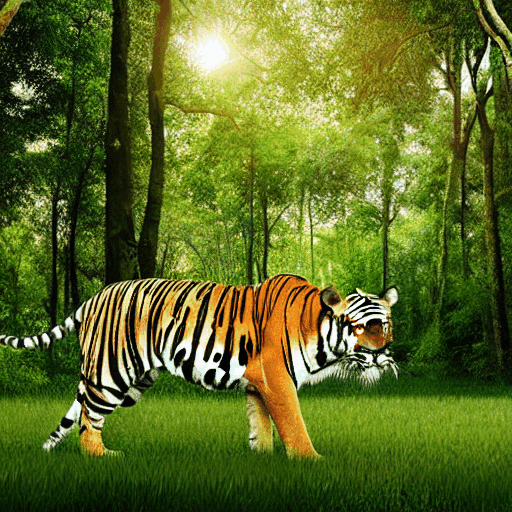

In [25]:
!mkdir /content/output
display_images(images, "/content/output")

In [26]:
# Diffusion latents interpolation for a single prompt
# a single prompt , with spherical linear interpolation (slerp) between two latents, thus generating
# a smooth transition gif

In [1]:
# spherical linear interpolation function
def slerp(v0, v1, num, t0 = 0, t1 = 1.0):
  v0 = v0.detach().cpu().numpy()
  v1 = v1.detach().cpu().numpy()
  def interpolation(t,v0,v1,DOT_THRESHOLD = 0.9995):
    dot=np.sum(v0*v1/(np.linalg.norm(v0) * np.linalg.norm(v1)))
    if np.abs(dot) > DOT_THRESHOLD:
      v2 = (1-t) * v0 + t * v1
    else:
      theta_0 = np.arccos(dot)
      sin_theta_0 = np.sin(theta_0)
      theta_t = theta_0 * t
      sin_theta_t = np.sin(theta_t)
      s0 = np.sin(theta_0 - theta_t) / sin_theta_0
      s1 = sin_theta_t / sin_theta_0
      v2 = s0 * v0 + s1 * v1
    return v2
  t = np.linspace(t0, t1, num)
  v3 = torch.tensor(np.array([interpolation(t[i],v0, v1) for i in range(num)]))
  return v3


In [2]:
prompt = "Epic shot of a Royal Bengal Tiger, dense Indian jungle background, calm, serene, wonderful light setting, little photorealistic, digital painting, sharp focus, top wildlife photography image"
neg_prompt = "poorly drawn,cartoon, 2d, disfigured, bad art, deformed, poorly drawn, extra limbs, close up, b&w, weird colors, blurr"

In [16]:
latents = torch.randn(
    (2, pipe.unet.config.in_channels, height // 8, width // 8),
    generator=None,
)


In [17]:
# latents interpolated through spherical interpolation
interp_latents = slerp(latents[0], latents[1], num_interpolation_steps)


In [19]:
images = []
for latent in tqdm(interp_latents):
  images.append(
      pipe(
          prompt, height=height, width = width,
          negative_prompt = neg_prompt,
          num_inference_steps = num_inference_steps,
          guidance_scale = guidance_scale,
          latents = latent[None,...].to(torch.float32), # Cast latents to float32
          num_images_per_prompt=1,
          generator=None,
      ).images
  )

  0%|          | 0/30 [00:00<?, ?it/s]

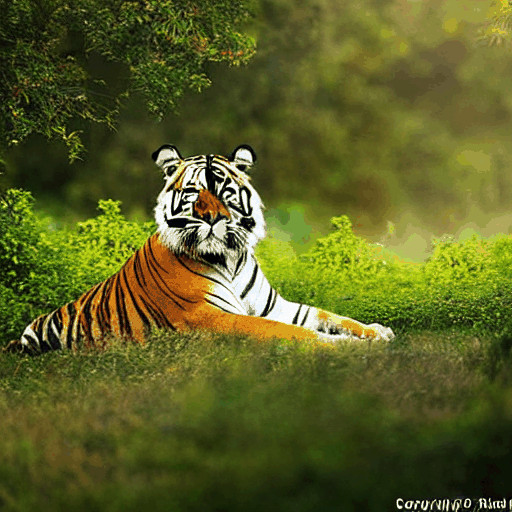

In [20]:
!mkdir /content/output
display_images(images, "/content/output")

Circular walk through the diffusion latent space

In [21]:
prompt = "Beautiful morning sun rise in the mountains, dawn,  Aivazovsky style"
negative_prompt = "picture frames"


In [22]:
latents = torch.randn(
    2,1,pipe.unet.config.in_channels, height // 8, width // 8
)


In [23]:
# two latents one in each direction
walk_noise_x = latents[0].to(device)
walk_noise_y = latents[1].to(device)

walk_scale_x = torch.cos(torch.linspace(0,2, num_inference_steps) * torch.pi).to(device)
walk_scale_y = torch.sin(torch.linspace(0,2, num_inference_steps) * torch.pi).to(device)
# applying interpolation to noise
noise_x = torch.tensordot(walk_scale_x, walk_noise_x, dims=0)
noise_y = torch.tensordot(walk_scale_y, walk_noise_y, dims=0)




In [24]:
circular_latents= noise_x + noise_y

In [27]:
images = []
for latent in tqdm(circular_latents):
  images.append(
      pipe(
          prompt, height=height, width = width,
          negative_prompt = negative_prompt,
          num_inference_steps = num_inference_steps,
          guidance_scale = guidance_scale,
          latents = latent,
          num_images_per_prompt=1,
          generator=None,
      ).images
  )

  0%|          | 0/30 [00:00<?, ?it/s]

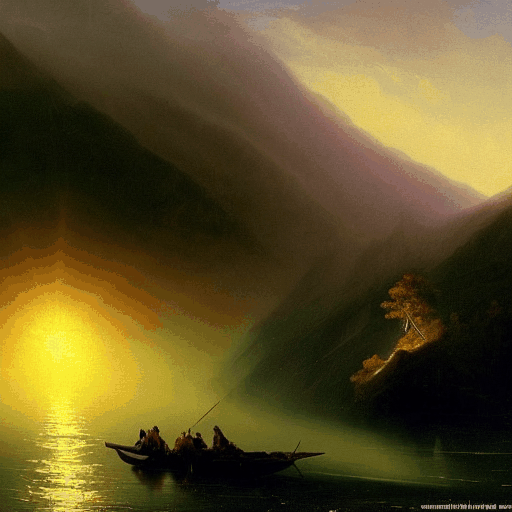

In [28]:
display_images(images, "/content/output_circular")